In [2]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [32]:
import os
import numpy as np
import pandas as pd
import matplotlib
from matplotlib import pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import KFold
from sklearn.metrics import confusion_matrix
from sklearn.metrics import recall_score, precision_score
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import lightgbm as lgb

In [33]:
def score_classifier(dataset,
                     classifier,
                     labels,
                     nb_splits:int=3,
                     ):

    """
    performs 3 random trainings/tests to build a confusion matrix and prints results with precision and recall scores
    :param dataset: the dataset to work on
    :param classifier: the classifier to use
    :param labels: the labels used for training and validation
    :return:
    """

    kf = KFold(n_splits=nb_splits,
               random_state=50,
               shuffle=True
               )
    confusion_mat = np.zeros((2,2))
    recall = 0
    for training_ids,test_ids in kf.split(dataset):
        training_set = dataset[training_ids]
        training_labels = labels[training_ids]
        test_set = dataset[test_ids]
        test_labels = labels[test_ids]
        classifier.fit(training_set,training_labels)
        predicted_labels = classifier.predict(test_set)
        confusion_mat+=confusion_matrix(test_labels,predicted_labels)
        recall += recall_score(test_labels, predicted_labels)
    recall/=nb_splits

    return confusion_mat, recall

In [34]:
from typing import Union, List
import re
import unidecode

def ts_slugify(ts : Union[str, pd.Series]):
    # slugify a pandas series or a string
    # remove special characters, accents and spaces
    # replace spaces by underscores
    # convert to lower case
    # it's a bit slow
    # TODO : use np.vectorize to make it faster
    if isinstance(ts, pd.Series):
        ts = ts.str.lower().str.replace(' ', '_')
        ts = ts.str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8')
        ts = ts.str.replace(pat="[^0-9A-z%_-]+", repl='', regex=True)
        ts = ts.str.replace(pat="['\\\\']", repl='', regex=True)
        return ts.str.strip('_')
    if isinstance(ts, str):
        string = ts.lower().replace(' ', '_')
        #replace % by percent
        string = string.replace('%', '_pca')
        string = unidecode.unidecode(string)
        string = re.sub('[^0-9A-z%_-]+', '', string)
        string = re.sub("['\\\\']", '', string)
        return string.strip('_')

In [35]:
!pwd

/Users/ramansheshka/code/test_datascience_mpdata/notebooks


## Data Overview

In [7]:
#parent directory
parent_dir = os.path.dirname(os.getcwd())
print(parent_dir)


/Users/ramansheshka/code/test_datascience_mpdata


### Load the data

In [8]:
# Load dataset
df_raw = pd.read_csv(os.path.join(parent_dir,"data_test","nba_logreg.csv"))

In [9]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1340 entries, 0 to 1339
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Name         1340 non-null   object 
 1   GP           1340 non-null   int64  
 2   MIN          1340 non-null   float64
 3   PTS          1340 non-null   float64
 4   FGM          1340 non-null   float64
 5   FGA          1340 non-null   float64
 6   FG%          1340 non-null   float64
 7   3P Made      1340 non-null   float64
 8   3PA          1340 non-null   float64
 9   3P%          1329 non-null   float64
 10  FTM          1340 non-null   float64
 11  FTA          1340 non-null   float64
 12  FT%          1340 non-null   float64
 13  OREB         1340 non-null   float64
 14  DREB         1340 non-null   float64
 15  REB          1340 non-null   float64
 16  AST          1340 non-null   float64
 17  STL          1340 non-null   float64
 18  BLK          1340 non-null   float64
 19  TOV   

### Data cleaning

i don't like the upper case in the column names, let's fix that

In [10]:
raw_columns_list = df_raw.columns.tolist()
print(raw_columns_list)
slug_columns_list = [ts_slugify(s) for s in raw_columns_list]
print(slug_columns_list)
#rename columns
df_raw.columns = slug_columns_list

['Name', 'GP', 'MIN', 'PTS', 'FGM', 'FGA', 'FG%', '3P Made', '3PA', '3P%', 'FTM', 'FTA', 'FT%', 'OREB', 'DREB', 'REB', 'AST', 'STL', 'BLK', 'TOV', 'TARGET_5Yrs']
['name', 'gp', 'min', 'pts', 'fgm', 'fga', 'fg_pca', '3p_made', '3pa', '3p_pca', 'ftm', 'fta', 'ft_pca', 'oreb', 'dreb', 'reb', 'ast', 'stl', 'blk', 'tov', 'target_5yrs']


In [11]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1340 entries, 0 to 1339
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   name         1340 non-null   object 
 1   gp           1340 non-null   int64  
 2   min          1340 non-null   float64
 3   pts          1340 non-null   float64
 4   fgm          1340 non-null   float64
 5   fga          1340 non-null   float64
 6   fg_pca       1340 non-null   float64
 7   3p_made      1340 non-null   float64
 8   3pa          1340 non-null   float64
 9   3p_pca       1329 non-null   float64
 10  ftm          1340 non-null   float64
 11  fta          1340 non-null   float64
 12  ft_pca       1340 non-null   float64
 13  oreb         1340 non-null   float64
 14  dreb         1340 non-null   float64
 15  reb          1340 non-null   float64
 16  ast          1340 non-null   float64
 17  stl          1340 non-null   float64
 18  blk          1340 non-null   float64
 19  tov   

It's a relatively small datase, only 1.5K rows, so no DL. i will be able to converge custom made regressor, havy fir asked problem. so pure ML.
Target is ```target_5yrs columns``` : takes 0 or 1, so classification problem.

In [12]:
df_raw.sample(5)

,name,gp,min,pts,fgm,fga,fg_pca,3p_made,3pa,3p_pca,...,fta,ft_pca,oreb,dreb,reb,ast,stl,blk,tov,target_5yrs
1297,James Robinson,58,11.6,4.8,1.8,4.9,36.5,0.4,1.3,31.5,...,1.2,67.2,0.6,0.8,1.3,1.2,0.5,0.3,0.9,1.0
560,Kyle Macy,82,17.9,8.1,3.3,6.5,51.1,0.1,0.6,23.5,...,1.5,89.9,0.5,1.1,1.6,2.0,0.9,0.1,1.2,1.0
197,Michael Anderson,36,20.3,5.7,2.0,4.9,41.7,0.0,0.2,14.3,...,2.3,69.5,1.2,1.3,2.5,4.3,1.2,0.1,2.3,0.0
209,Mark Bryant,36,7.0,1.6,0.7,1.6,43.1,0.0,0.0,0.0,...,0.4,69.2,0.7,1.2,1.9,0.2,0.1,0.1,0.3,1.0
30,Dale Davis,64,20.3,6.2,2.4,4.4,55.2,0.0,0.0,0.0,...,2.4,57.2,2.5,3.9,6.4,0.5,0.4,1.2,0.8,1.0


In [13]:
df_raw.describe()

,gp,min,pts,fgm,fga,fg_pca,3p_made,3pa,3p_pca,ftm,fta,ft_pca,oreb,dreb,reb,ast,stl,blk,tov,target_5yrs
count,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1329.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000
mean,60.414179,17.624627,6.801493,2.629104,5.885299,44.169403,0.247612,0.779179,19.308126,1.297687,1.821940,70.300299,1.009403,2.025746,3.034478,1.550522,0.618507,0.368582,1.193582,0.620149
std,17.433992,8.307964,4.357545,1.683555,3.593488,6.137679,0.383688,1.061847,16.022916,0.987246,1.322984,10.578479,0.777119,1.360008,2.057774,1.471169,0.409759,0.429049,0.722541,0.485531
min,11.000000,3.100000,0.700000,0.300000,0.800000,23.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000,0.300000,0.000000,0.000000,0.000000,0.100000,0.000000
25%,47.000000,10.875000,3.700000,1.400000,3.300000,40.200000,0.000000,0.000000,0.000000,0.600000,0.900000,64.700000,0.400000,1.000000,1.500000,0.600000,0.300000,0.100000,0.700000,0.000000
50%,63.000000,16.100000,5.550000,2.100000,4.800000,44.100000,0.100000,0.300000,22.400000,1.000000,1.500000,71.250000,0.800000,1.700000,2.500000,1.100000,0.500000,0.200000,1.000000,1.000000
75%,77.000000,22.900000,8.800000,3.400000,7.500000,47.900000,0.400000,1.200000,32.500000,1.600000,2.300000,77.600000,1.400000,2.600000,4.000000,2.000000,0.800000,0.500000,1.500000,1.000000
max,82.000000,40.900000,28.200000,10.200000,19.800000,73.700000,2.300000,6.500000,100.000000,7.700000,10.200000,100.000000,5.300000,9.600000,13.900000,10.600000,2.500000,3.900000,4.400000,1.000000


In [14]:
# duplicate rows
df_raw.duplicated().sum()

12

In [15]:
# show duplicated rows
df_raw[df_raw.duplicated(keep=False)].sort_values(by='name')

,name,gp,min,pts,fgm,fga,fg_pca,3p_made,3pa,3p_pca,...,fta,ft_pca,oreb,dreb,reb,ast,stl,blk,tov,target_5yrs
366,Charles Jones,78,20.1,8.4,3.0,5.8,52.0,0.0,0.1,0.0,...,3.6,64.8,1.8,3.3,5.1,1.6,0.6,0.8,1.8,0.0
369,Charles Jones,29,16.4,3.7,1.3,4.2,31.7,0.7,2.1,31.1,...,0.8,50.0,0.3,1.1,1.4,1.4,0.6,0.2,1.0,0.0
368,Charles Jones,29,16.4,3.7,1.3,4.2,31.7,0.7,2.1,31.1,...,0.8,50.0,0.3,1.1,1.4,1.4,0.6,0.2,1.0,0.0
365,Charles Jones,78,20.1,8.4,3.0,5.8,52.0,0.0,0.1,0.0,...,3.6,64.8,1.8,3.3,5.1,1.6,0.6,0.8,1.8,0.0
169,Charles Smith,34,8.6,3.5,1.4,3.7,39.2,0.4,1.4,31.9,...,0.3,54.5,0.4,0.4,0.8,0.6,0.3,0.2,0.8,1.0
162,Charles Smith,60,8.7,2.9,1.0,2.2,44.4,0.0,0.1,0.0,...,1.3,69.7,0.2,0.9,1.2,1.7,0.6,0.1,0.6,1.0
168,Charles Smith,34,8.6,3.5,1.4,3.7,39.2,0.4,1.4,31.9,...,0.3,54.5,0.4,0.4,0.8,0.6,0.3,0.2,0.8,1.0
163,Charles Smith,60,8.7,2.9,1.0,2.2,44.4,0.0,0.1,0.0,...,1.3,69.7,0.2,0.9,1.2,1.7,0.6,0.1,0.6,1.0
166,Charles Smith,71,30.4,16.3,6.1,12.4,49.5,0.0,0.0,0.0,...,5.5,72.5,2.4,4.1,6.5,1.5,1.0,1.3,2.1,1.0
165,Charles Smith,71,30.4,16.3,6.1,12.4,49.5,0.0,0.0,0.0,...,5.5,72.5,2.4,4.1,6.5,1.5,1.0,1.3,2.1,1.0


In [16]:
# drop duplicates
df_raw.drop_duplicates(inplace=True)

In [17]:
df_raw[df_raw.duplicated(keep=False)].sort_values(by='name')

,name,gp,min,pts,fgm,fga,fg_pca,3p_made,3pa,3p_pca,...,fta,ft_pca,oreb,dreb,reb,ast,stl,blk,tov,target_5yrs


In [18]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1328 entries, 0 to 1339
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   name         1328 non-null   object 
 1   gp           1328 non-null   int64  
 2   min          1328 non-null   float64
 3   pts          1328 non-null   float64
 4   fgm          1328 non-null   float64
 5   fga          1328 non-null   float64
 6   fg_pca       1328 non-null   float64
 7   3p_made      1328 non-null   float64
 8   3pa          1328 non-null   float64
 9   3p_pca       1318 non-null   float64
 10  ftm          1328 non-null   float64
 11  fta          1328 non-null   float64
 12  ft_pca       1328 non-null   float64
 13  oreb         1328 non-null   float64
 14  dreb         1328 non-null   float64
 15  reb          1328 non-null   float64
 16  ast          1328 non-null   float64
 17  stl          1328 non-null   float64
 18  blk          1328 non-null   float64
 19  tov        

In [19]:
#nan values
df_raw.isna().sum()

name            0
gp              0
min             0
pts             0
fgm             0
fga             0
fg_pca          0
3p_made         0
3pa             0
3p_pca         10
ftm             0
fta             0
ft_pca          0
oreb            0
dreb            0
reb             0
ast             0
stl             0
blk             0
tov             0
target_5yrs     0
dtype: int64

In [20]:
# let's see the rows with nan values
df_raw[df_raw.isna().any(axis=1)]

,name,gp,min,pts,fgm,fga,fg_pca,3p_made,3pa,3p_pca,...,fta,ft_pca,oreb,dreb,reb,ast,stl,blk,tov,target_5yrs
338,Ken Johnson,64,12.7,4.1,1.8,3.3,52.8,0.0,0.0,NaN,...,1.3,43.5,1.4,2.4,3.8,0.3,0.2,0.3,0.9,0.0
340,Pete Williams,53,10.8,2.8,1.3,2.1,60.4,0.0,0.0,NaN,...,0.8,42.5,0.9,1.9,2.8,0.3,0.4,0.4,0.4,0.0
358,Melvin Turpin,79,24.7,10.6,4.6,9.0,51.1,0.0,0.0,NaN,...,1.8,78.4,2.0,3.8,5.7,0.5,0.5,1.1,1.5,1.0
386,Jim Petersen,60,11.9,3.2,1.2,2.4,48.6,0.0,0.0,NaN,...,1.1,75.8,0.7,1.7,2.5,0.5,0.2,0.5,1.2,1.0
397,Tom Scheffler,39,6.9,1.3,0.5,1.3,41.2,0.0,0.0,NaN,...,0.5,50.0,0.5,1.5,1.9,0.3,0.2,0.3,0.4,0.0
507,Sam Williams,59,18.2,6.1,2.6,4.7,55.6,0.0,0.0,NaN,...,1.5,55.1,1.5,3.7,5.2,0.6,0.8,1.3,1.1,0.0
509,Kurt Nimphius,63,17.2,5.3,2.2,4.7,46.1,0.0,0.0,NaN,...,1.7,58.3,1.5,3.2,4.7,1.0,0.3,1.3,0.9,1.0
510,Pete Verhoeven,71,17.0,4.9,2.1,4.2,50.3,0.0,0.0,NaN,...,1.0,70.8,1.5,2.1,3.6,0.7,0.6,0.3,0.8,1.0
521,Jim Smith,72,11.9,2.9,1.2,2.3,50.9,0.0,0.0,NaN,...,1.2,45.9,1.0,1.5,2.5,0.6,0.3,0.7,0.7,0.0
559,Jeff Wilkins,56,18.9,4.7,2.1,4.6,45.0,0.0,0.0,NaN,...,0.7,67.5,1.1,3.8,4.9,0.7,0.6,0.8,1.1,1.0


### let's remplace nan values by the mean of the column rp_pca

In [21]:
# replacing Nan values (only present when no 3 points attempts have been performed by a player)
column_name = '3p_pca'
array = df_raw[column_name].values
array_clean = np.nan_to_num(array,
                            nan=0.0
                            )
df_clean = df_raw.copy()
df_clean[column_name] = array_clean
#for x in np.argwhere(np.isnan(df_vals)):
#    df_vals[x]=0.0

## Data exploration

In [22]:
all_features = df_raw.columns.tolist()
all_features.remove('name')
all_features.remove('target_5yrs')
print(all_features)
df_clean.groupby(by=['target_5yrs'])[all_features].mean()

['gp', 'min', 'pts', 'fgm', 'fga', 'fg_pca', '3p_made', '3pa', '3p_pca', 'ftm', 'fta', 'ft_pca', 'oreb', 'dreb', 'reb', 'ast', 'stl', 'blk', 'tov']


,gp,min,pts,fgm,fga,fg_pca,3p_made,3pa,3p_pca,ftm,fta,ft_pca,oreb,dreb,reb,ast,stl,blk,tov
target_5yrs,,,,,,,,,,,,,,,,,,,
0.0,51.434524,14.231746,5.038690,1.945040,4.540278,42.374206,0.229365,0.753175,19.193651,0.921825,1.318254,68.902381,0.716865,1.527976,2.242857,1.215079,0.498413,0.252976,0.939087
1.0,65.901699,19.715655,7.884102,3.049393,6.708374,45.291990,0.258981,0.794296,19.167597,1.528277,2.130340,71.195510,1.188835,2.333252,3.521845,1.756796,0.692840,0.439442,1.349272


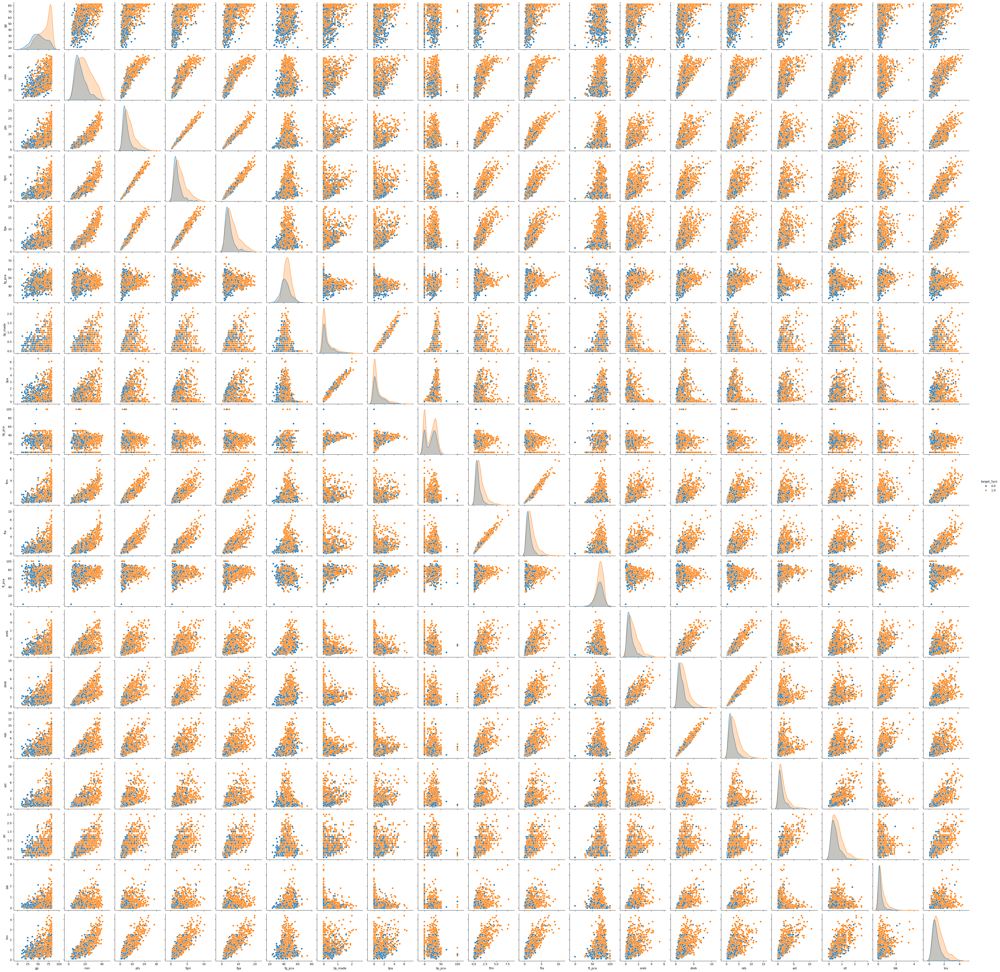

In [23]:
import seaborn as sns

g = sns.pairplot(df_clean,
             hue='target_5yrs',
             diag_kind='kde',
             corner=False,
             )
plt.show()

In [24]:
#correlation matrix
corr_array = df_clean[all_features].corr()

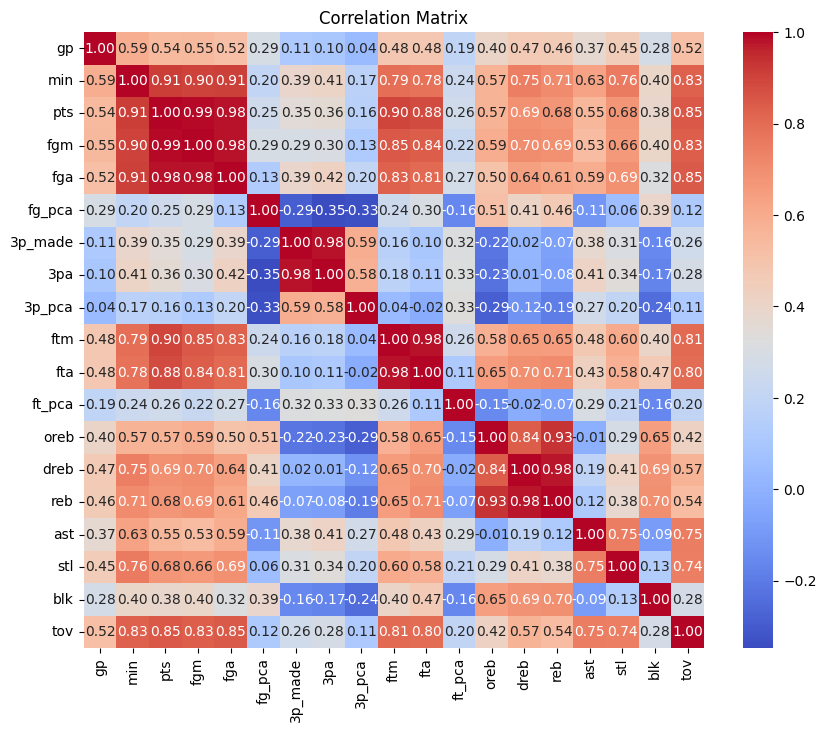

In [25]:
# visualize the correlation matrix
fig,ax = plt.subplots(figsize=(10, 8))
sns.heatmap(corr_array,
            annot=True,
            cmap='coolwarm',
            fmt=".2f",
            ax=ax
            )
plt.title("Correlation Matrix")
plt.show()

target_5yrs
1.0    824
0.0    504
Name: count, dtype: int64

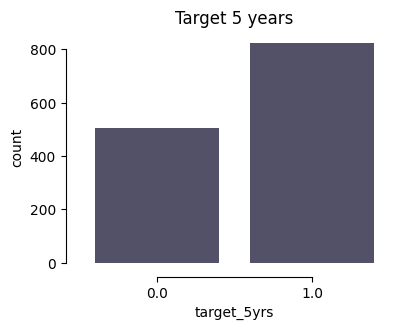

In [26]:
display(df_clean['target_5yrs'].value_counts())

# bar plot of target_5yrs
fig, ax = plt.subplots(figsize=(4, 3))
sns.countplot(x='target_5yrs',
              data=df_clean,
              color = "#03012d",
              alpha = 0.7,
              ax=ax
              )
sns.despine(offset=10,
            trim=True,
            ax=ax
            )
ax.set_title('Target 5 years')
plt.show()

## retroengineering

In [27]:
df_clean.columns

Index(['name', 'gp', 'min', 'pts', 'fgm', 'fga', 'fg_pca', '3p_made', '3pa',
       '3p_pca', 'ftm', 'fta', 'ft_pca', 'oreb', 'dreb', 'reb', 'ast', 'stl',
       'blk', 'tov', 'target_5yrs'],
      dtype='object')

In [28]:
df_clean

,name,gp,min,pts,fgm,fga,fg_pca,3p_made,3pa,3p_pca,...,fta,ft_pca,oreb,dreb,reb,ast,stl,blk,tov,target_5yrs
0,Brandon Ingram,36,27.4,7.4,2.6,7.6,34.7,0.5,2.1,25.0,...,2.3,69.9,0.7,3.4,4.1,1.9,0.4,0.4,1.3,0.0
1,Andrew Harrison,35,26.9,7.2,2.0,6.7,29.6,0.7,2.8,23.5,...,3.4,76.5,0.5,2.0,2.4,3.7,1.1,0.5,1.6,0.0
2,JaKarr Sampson,74,15.3,5.2,2.0,4.7,42.2,0.4,1.7,24.4,...,1.3,67.0,0.5,1.7,2.2,1.0,0.5,0.3,1.0,0.0
3,Malik Sealy,58,11.6,5.7,2.3,5.5,42.6,0.1,0.5,22.6,...,1.3,68.9,1.0,0.9,1.9,0.8,0.6,0.1,1.0,1.0
4,Matt Geiger,48,11.5,4.5,1.6,3.0,52.4,0.0,0.1,0.0,...,1.9,67.4,1.0,1.5,2.5,0.3,0.3,0.4,0.8,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1334,Chris Smith,80,15.8,4.3,1.6,3.6,43.3,0.0,0.2,14.3,...,1.5,79.2,0.4,0.8,1.2,2.5,0.6,0.2,0.8,0.0
1336,Brent Price,68,12.6,3.9,1.5,4.1,35.8,0.1,0.7,16.7,...,1.0,79.4,0.4,1.1,1.5,2.3,0.8,0.0,1.3,1.0
1337,Marlon Maxey,43,12.1,5.4,2.2,3.9,55.0,0.0,0.0,0.0,...,1.6,64.3,1.5,2.3,3.8,0.3,0.3,0.4,0.9,0.0
1338,Litterial Green,52,12.0,4.5,1.7,3.8,43.9,0.0,0.2,10.0,...,1.8,62.5,0.2,0.4,0.7,2.2,0.4,0.1,0.8,1.0


## Modelisation

In [29]:
df = df_clean.copy()

### build the dataset

In [ ]:
class Preprocessor:
    def __init__(self,
                 df : pd.DataFrame,
                 features : List[str],
                 target : str = 'target_5yrs',
                 id_col : str = 'name',
                 ):
        self.__df_raw = df
        self.__features = features
        self.__target = target
        self.__id_col = id_col
        self._df = None
        self._X = None
        self._y = None
        self._names = None
        self.__normalize = True
        self._scaler = MinMaxScaler()


    def build_dataset(self):
        """
        Build a dataset from a dataframe
        :return: X, y, names
        """
        assert self._df is not None, "df is None"
        assert self.id_col in self.df.columns, f"{self.id_col} not in columns"
        assert self.target in self.df.columns, f"{self.target} not in columns"

        # extract names, labels, features names and values
        self.names = self.df[self.id_col].values.tolist() # players names
        labels = self.df[self.target].values # labels

        if self.features is None:
            self.features = self.df.drop([self.target,self.id_col],axis=1).columns.values
            df_vals = self.df.drop([self.target,self.id_col],axis=1).values
        else:
            assert all([f in self.df.columns for f in self.features]), "features not in columns"
            assert self.target not in self.features, f"{self.target} in features"
            assert self.id_col not in self.features, f"{self.id_col} in features"
            df_vals = self.df[self.features].values
        # normalize dataset
        self.X = MinMaxScaler().fit_transform(df_vals)
        self.y = labels
        return self.X, self.y, self.names

    def __str__(self):
        return f"Preprocessor with {len(self.features)} features"

    def __repr__(self):
        return f"Preprocessor with {len(self.features)} features"


def build_dataset(df : pd.DataFrame,
                  features : List[str]=None,
                  id_col : str = 'name',
                  target : str = 'target_5yrs',
                  ) :
    """
    Build a dataset from a dataframe
    :param df: the dataframe
    :param features: the features to use
    :param id_col: the id column
    :param target: the target column
    :return: X, y, names
    """
    assert df is not None, "df is None"
    assert id_col in df.columns, f"{id_col} not in columns"
    assert target in df.columns, f"{target} not in columns"


    # extract names, labels, features names and values
    names = df[id_col].values.tolist() # players names
    labels = df[target].values # labels

    if features is None:
        features = df.drop([target,id_col],axis=1).columns.values
        df_vals = df.drop([target,id_col],axis=1).values
    else:
        assert all([f in df.columns for f in features]), "features not in columns"
        assert target not in features, f"{target} in features"
        assert id_col not in features, f"{id_col} in features"
        df_vals = df[features].values
    # normalize dataset
    X = MinMaxScaler().fit_transform(df_vals)
    y = labels
    return X, y, names

In [70]:
X, y, names = build_dataset(df_clean)

### baseline model

In [71]:
# create a train/val/test split
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.1,
                                                    random_state=42
                                                    )
print(X_train.shape,
      X_test.shape,
      y_train.shape,
      y_test.shape
      )


(1195, 19) (133, 19) (1195,) (133,)


In [72]:
#example of scoring with support vector classifier
base_estimator = SVC()
model_confusion_matrix,model_recal = score_classifier(X_train,
                                                      base_estimator,
                                                      y_train
                                                      )

print(model_confusion_matrix)
print(model_recal)

base_estimator.fit(X_train, y_train)
# use sklearn.metrics.recall_score(y_true, y_pred, *)

y_pred = base_estimator.predict(X_test)

recall_ = recall_score(y_test, y_pred)
print(f"recall score : {recall_}")
#from sklearn.metrics import ConfusionMatrixDisplay

[[248. 210.]
 [146. 591.]]
0.8027444857724509
recall score : 0.7701149425287356


### Random Forest Classifier

In [73]:
estimator = RandomForestClassifier(n_estimators=100,
                                   random_state=42
                                   )
model_confusion_matrix,model_recal = score_classifier(X_train,
                                                      estimator,
                                                      y_train
                                                      )

print(model_confusion_matrix)
print(model_recal)

estimator.fit(X_train, y_train)
# use sklearn.metrics.recall_score(y_true, y_pred, *)

y_pred = estimator.predict(X_test)

recall_ = recall_score(y_test, y_pred)
print(f"recall score : {recall_}")

[[233. 225.]
 [158. 579.]]
0.7869694325817759
recall score : 0.7931034482758621


In [106]:
type(estimator)

sklearn.ensemble._forest.RandomForestClassifier

### Dumb LightGBM classifier

In [74]:
params = {
    "num_leaves": 5,
    "min_data_in_leaf": 5,
    "max_bin": 255,
    "learning_rate": 0.01,
    "boosting_type": "gbdt",
    "objective": "binary",
    "metric": "recall",
    "verbose": -1,
    "max_depth": 5,
}

lgbm_clf = lgb.LGBMClassifier(**params)
lgbm_clf.fit(X_train, y_train)
y_predict = lgbm_clf.predict(X_test)
recall_ = recall_score(y_test, y_predict)

print(f"recall score : {recall_}")

recall score : 0.8505747126436781


#### Train LightGBM model

In [75]:
def recall_eval(preds, train_data):
    threshold = 0.5
    labels = train_data.get_label()
    preds_binary = (preds > threshold).astype(int) #np.round(preds) should be the same
    recall_ = recall_score(labels, preds_binary)
    return 'recall', recall_, True #return name, value, is_higher_better

In [76]:
X_train_, X_val, y_train_, y_val = train_test_split(X_train,
                                                    y_train,
                                                    random_state=42,
                                                    test_size=0.2,
                                                    )
print(X_train_.shape,
      X_val.shape,
      y_train_.shape,
      y_val.shape
      )

train_data = lgb.Dataset(X_train_, label=y_train_)

val_data = lgb.Dataset(X_val, label=y_val)

params = {
    "num_leaves": 5,
    "min_data_in_leaf": 5,
    "max_bin": 255,
    "learning_rate": 0.01,
    "boosting_type": "gbdt",
    "objective": "binary",
    "metric": "binary_logloss",
    "verbose": 10,
    "max_depth": 5,
}

model = lgb.train(
     params,
     train_set = train_data,
     num_boost_round=100,
     valid_sets=[val_data],
     feval=recall_eval,
    )

(956, 19) (239, 19) (956,) (239,)
[LightGBM] [Info] Number of positive: 592, number of negative: 364
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.064413
[LightGBM] [Debug] init for col-wise cost 0.000002 seconds, init for row-wise cost 0.000236 seconds
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1710
[LightGBM] [Info] Number of data points in the train set: 956, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.619247 -> initscore=0.486353
[LightGBM] [Info] Start training from score 0.486353
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves =

In [77]:
proba_pred = model.predict(X_test)
threshold = 0.5
y_pred = (proba_pred > threshold).astype(int)
print(y_pred)
recall_ = recall_score(y_test, y_pred)
print(f"recall score : {recall_}")

[0 1 0 0 1 0 1 0 1 1 1 1 1 1 1 0 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 1 1
 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 1 1
 0 0 0 0 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 1 1 1 0 0
 1 1 0 1 1 0 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1]
recall score : 0.8620689655172413


#### SHAP values, feature importance

In [78]:
import shap

# print the JS visualization code to the notebook
shap.initjs()

In [79]:
explainer = shap.TreeExplainer(model)
shap_values = explainer(X)

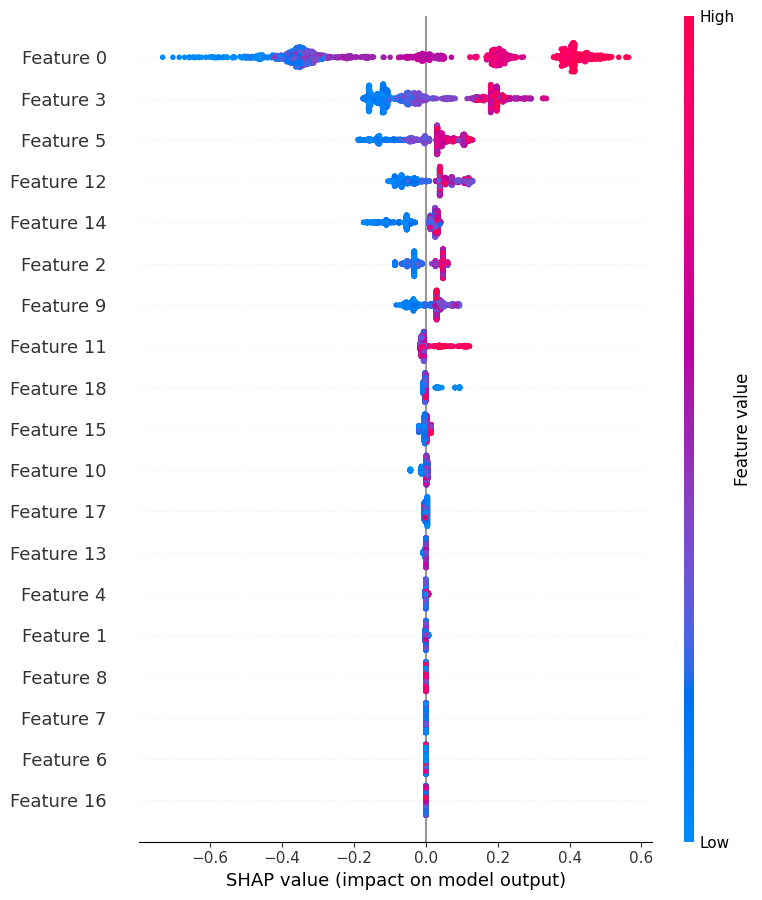

In [80]:
shap.summary_plot(shap_values, X)

So let's select the most important features and retrain the model

In [81]:
print(all_features)
selected_features = [all_features[i] for i in [0,3,5,12,14,2,9,11,18]]
print(selected_features)

['gp', 'min', 'pts', 'fgm', 'fga', 'fg_pca', '3p_made', '3pa', '3p_pca', 'ftm', 'fta', 'ft_pca', 'oreb', 'dreb', 'reb', 'ast', 'stl', 'blk', 'tov']
['gp', 'fgm', 'fg_pca', 'oreb', 'reb', 'pts', 'ftm', 'ft_pca', 'tov']


In [93]:
X_selected, y_selected, names = build_dataset(df_clean,
                              features=selected_features
                              )
X_train_selected, X_test_selected, y_train_selected, y_test_selected = train_test_split(X_selected,
                                                    y_selected,
                                                    test_size=0.1,
                                                    random_state=42
                                                    )

X_train_, X_val, y_train_, y_val = train_test_split(X_train_selected,
                                                    y_train_selected,
                                                    random_state=42,
                                                    test_size=0.2,
                                                    )
print(X_train_.shape,
      X_val.shape,
      y_train_.shape,
      y_val.shape
      )

train_data = lgb.Dataset(X_train_, label=y_train_)

val_data = lgb.Dataset(X_val, label=y_val)

params = {
    "num_leaves": 5,
    "min_data_in_leaf": 5,
    "max_bin": 255,
    "learning_rate": 0.01,
    "boosting_type": "gbdt",
    "objective": "binary",
    "metric": "binary_logloss",
    "verbose": 10,
    "max_depth": 5,
}

model_selected = lgb.train(
     params,
     train_set = train_data,
     num_boost_round=100,
     valid_sets=[val_data],
     feval=recall_eval,
    )

(956, 9) (239, 9) (956,) (239,)
[LightGBM] [Info] Number of positive: 592, number of negative: 364
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.001627
[LightGBM] [Debug] init for col-wise cost 0.000002 seconds, init for row-wise cost 0.000091 seconds
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 943
[LightGBM] [Info] Number of data points in the train set: 956, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.619247 -> initscore=0.486353
[LightGBM] [Info] Start training from score 0.486353
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves = 5 a

In [95]:
proba_pred = model_selected.predict(X_test_selected)
threshold = 0.5
y_pred = (proba_pred > threshold).astype(int)
print(y_pred)
recall_ = recall_score(y_test, y_pred)
print(f"recall score : {recall_}")

[0 1 0 0 1 0 1 0 1 1 1 1 1 1 1 0 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 1 1
 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 1 1
 0 0 0 0 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 1 1 1 0 0
 1 1 0 1 1 0 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1]
recall score : 0.8620689655172413


In [ ]:

from mpdatanba.utils import create_folder_if_not_exists

# create a folder to save the model
model_folder = os.path.join(parent_dir,
                            "save_models"
                            )
print(model_folder)
create_folder_if_not_exists(model_folder)

# save the model
model_file = os.path.join(model_folder,
                          "model_selected.txt"
                          )
from mpdatanba.ml_logic.ml_workflow import load_model
model_selected.save_model(model_file)

/Users/ramansheshka/code/test_datascience_mpdata/save_models
Folder /Users/ramansheshka/code/test_datascience_mpdata/save_models already exists


In [122]:
# # load the model
# def load_model(model_file,
#                sklearn:bool=False,
#                ) :
#     if not sklearn:
#         model = lgb.Booster(model_file=model_file)
#     return model

from mpdatanba.ml_logic.ml_workflow import load_model

model_loaded = load_model()

Loading model...
[LightGBM] [Debug] Skipped header "tree" in file /Users/ramansheshka/code/test_datascience_mpdata/save_models/model_selected.txt
[LightGBM] [Debug] Skipped header "tree" in file /Users/ramansheshka/code/test_datascience_mpdata/save_models/model_selected.txt
[LightGBM] [Debug] Time for loading model: 0.002488 seconds
Model loaded from local disk


In [108]:
def predict_model(model,
                  X,
                  threshold:float=0.5,
                  ) :
    if isinstance(X, pd.DataFrame):
        X = X.values
    if isinstance(model, lgb.basic.Booster):
        proba_pred = model.predict(X)
        y_pred = (proba_pred > threshold).astype(int)
    else:
        # use sklearn model
        y_pred = model.predict(X)
    return y_pred

proba_pred = model_loaded.predict(X_test_selected)
y_pred = predict_model(model_loaded,
                       X_test_selected,
                        )
print(y_pred)
recall_ = recall_score(y_test, y_pred)
print(f"recall score : {recall_}")

[0 1 0 0 1 0 1 0 1 1 1 1 1 1 1 0 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 1 1
 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 1 1
 0 0 0 0 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 1 1 1 0 0
 1 1 0 1 1 0 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1]
recall score : 0.8620689655172413


In [116]:
# let's build test dataset to predict by api

api_x_test_normalized = X_test_selected[5]
print(api_x_test_normalized)

y_pred_api_test = predict_model(model_loaded,
                                [api_x_test_normalized],
                                )
print(y_pred_api_test)

print(y_test[5])

[0.52112676 0.06060606 0.28657315 0.01886792 0.04411765 0.05090909
 0.02597403 0.563      0.13953488]
[0]
0.0


In [88]:
! pip install optuna

In [89]:
import optuna

study = optuna.create_study(direction="maximize")

[I 2024-11-06 17:33:45,734] A new study created in memory with name: no-name-ce477b3b-e0bf-4161-aecf-2d600945d5a2


### Define Kfold cross-validation for LightGBM

In [90]:
# some lgbm parametrs from my previous projects
lgb_params = {
    'lambda_l1': 0.1,
    'lambda_l2': 0.5,
    'num_leaves': 5,
    'feature_fraction': 0.5,
    'bagging_fraction': 0.5,
    'bagging_freq': 5,
    'min_child_samples': 5,
    'learning_rate': 0.01,
    'task': 'train',
    'objective': 'binary',
    'boosting_type': 'gbdt',
    'seed': 42,
    "min_data_in_leaf": 5,
    "max_bin": 255,
    "verbose": 10,
    "max_depth": 5,
    'is_unbalance': True,
}


def lgbm_kfold_train(X_train,
                     y_train,
                     nb_splits:int=3
                     ):
    kf = KFold(n_splits=nb_splits,
               random_state=50,
               shuffle=True
               )
    n_ = 0
    confusion_mat = np.zeros((2,2))
    recall = 0
    for train_ids,val_ids in kf.split(X_train, y_train):
        if isinstance(X_train, pd.DataFrame) and isinstance(y_train, pd.Series):
            X_train_ = X_train.iloc[train_ids]
            X_val = X_train.iloc[val_ids]
            y_train_ = y_train.iloc[train_ids]
            y_val = y_train.iloc[val_ids]
        if isinstance(X_train, np.ndarray) and isinstance(y_train, np.ndarray):
            X_train_ = X_train[train_ids]
            X_val = X_train[val_ids]
            y_train_ = y_train[train_ids]
            y_val = y_train[val_ids]

        # create lgb.Dataset
        lgbm_X_train_ = lgb.Dataset[X_train_, y_train_]
        lgbm_X_val = lgb.Dataset[X_val, y_val]
        lgbm_model = lgb.train(
            lgb_params,
            train_set = lgbm_X_train_,
            num_boost_round=100,
            valid_sets=[lgbm_X_val],
            feval=recall_eval,
        )
        classifier.fit(training_set,training_labels)
        predicted_labels = classifier.predict(test_set)
        confusion_mat+=confusion_matrix(test_labels,predicted_labels)
        recall += recall_score(test_labels, predicted_labels)
    recall/=nb_splits


#### define the objective function

In [91]:
def objective(trial):

#     "boosting_type": "gbdt",
#     "objective": "binary",
#     "metric": "recall",
#     "verbose": -1,

  # Determine the hyperperatemers and their value ranges
  learning_rate = trial.suggest_float("learning_rate", 0.01, 0.1)
  num_leaves = trial.suggest_int("num_leaves", 2, 6)
  max_depth = trial.suggest_int("max_depth", -1, 6)
  min_child_samples = trial.suggest_int("min_child_samples", 5, 100)
  subsample = trial.suggest_float("subsample", 0.5, 1.0)
  colsample_bytree = trial.suggest_float("colsample_bytree", 0.5, 1.0)
  n_estimators = trial.suggest_int("n_estimators", 20, 200)
  min_data_in_leaf = trial.suggest_int("min_data_in_leaf", 5, 25)


  # Create and train the model
  model = lgb.LGBMClassifier(
  learning_rate=learning_rate,
  num_leaves=num_leaves,
  max_depth=max_depth,
  min_child_samples=min_child_samples,
  subsample=subsample,
  colsample_bytree=colsample_bytree,
  n_estimators=n_estimators,
  random_state=42
  )
  model.fit(X_train, y_train)

  # Evaluate model and return the metric
  y_pred = model.predict(X_test)
  accuracy = accuracy_score(y_test, y_pred)
  return accuracy

In [120]:
import mpdatanba
from mpdatanba import PARENT_BASE_PATH, BASE_PATH

print(PARENT_BASE_PATH)
print(BASE_PATH)

/Users/ramansheshka/code/test_datascience_mpdata
/Users/ramansheshka/code/test_datascience_mpdata/mpdatanba
